# Civitta default task

In [3]:
import pandas as pd
import numpy as np
import os
from ydata_profiling import ProfileReport
import matplotlib.pyplot as plt
import seaborn as sns

plt.style.use("seaborn-v0_8-muted")

In [4]:
from civitta.data_loader import DataLoader

df_raw = DataLoader().load()
df_raw.head()

,clientid,client_type,ratio,loan_type,loan_initial_term,loan_initial_amount,loan_to_value_ratio,annual_percentage_rate,monthly_interest_rate,region,branch,client_gender,income,vehicle_production_year,vehicle_initial_assessment_value,age,had_car_loan,had_other_loans
0,0,default,1.166667,leaseback,36,1920,0.200000,35.875763,3.374,region 9,branch 3,male,1214,2002,9600,37.0,0,0
1,1,default,1.027778,leaseback,54,5040,0.777778,36.079749,3.374,NaN,branch 3,male,0,1995,6480,36.0,0,0
2,2,default,0.916667,leasing,18,2400,0.454545,42.292028,3.374,region 2,branch 5,male,720,1999,5280,57.0,0,0
3,3,default,0.916667,leaseback,36,9360,0.886364,35.580055,3.374,NaN,branch 3,female,0,2000,10560,65.0,0,0
4,4,default,0.888889,leasing,54,5760,0.750000,37.090166,3.374,region 6,branch 2,male,0,2008,7680,35.0,0,0


### Exploratory Data Analysis

In [5]:
df = df_raw.copy(deep=True)

In [6]:
df.describe()

,clientid,ratio,loan_initial_term,loan_initial_amount,loan_to_value_ratio,annual_percentage_rate,monthly_interest_rate,income,vehicle_production_year,vehicle_initial_assessment_value,age,had_car_loan,had_other_loans
count,10970.000000,8389.000000,10970.000000,10970.000000,10970.000000,10970.000000,10970.000000,10970.000000,10970.000000,10970.000000,10948.000000,10970.000000,10970.000000
mean,5484.500000,0.273463,61.818323,6091.551048,0.625817,35.399138,3.119002,1143.732361,2003.043847,10286.784412,37.719401,0.148952,0.123974
std,3166.910561,0.293382,28.195104,3961.033909,0.220214,3.091041,0.344990,1573.420483,4.922018,7192.834063,11.298195,0.356057,0.329567
min,0.000000,0.000000,9.000000,1680.000000,0.040741,19.841096,2.530500,0.000000,1982.000000,1104.000000,18.000000,0.000000,0.000000
25%,2742.250000,0.066667,36.000000,3456.000000,0.500000,34.013923,2.671083,0.000000,1999.000000,6240.000000,29.000000,0.000000,0.000000
50%,5484.500000,0.166667,54.000000,4992.000000,0.666667,35.915354,3.374000,960.000000,2003.000000,8160.000000,35.000000,0.000000,0.000000
75%,8226.750000,0.375000,90.000000,7200.000000,0.789474,36.958098,3.374000,1440.000000,2006.000000,12212.000000,44.000000,0.000000,0.000000
max,10969.000000,4.166667,180.000000,93600.000000,8.478261,54.501862,3.374000,52800.000000,2020.000000,168000.000000,78.000000,1.000000,1.000000


In [15]:
profile = ProfileReport(df, title="Default dataset analysis", explorative=True)
# profile.to_file("docs/index.html")
profile

In [5]:
numerical_features = [
    "ratio", "loan_initial_term", 
    "loan_initial_amount", "loan_to_value_ratio",
    "annual_percentage_rate", "monthly_interest_rate",
    "income", "vehicle_initial_assessment_value",
    "age", "vehicle_production_year"
    ]

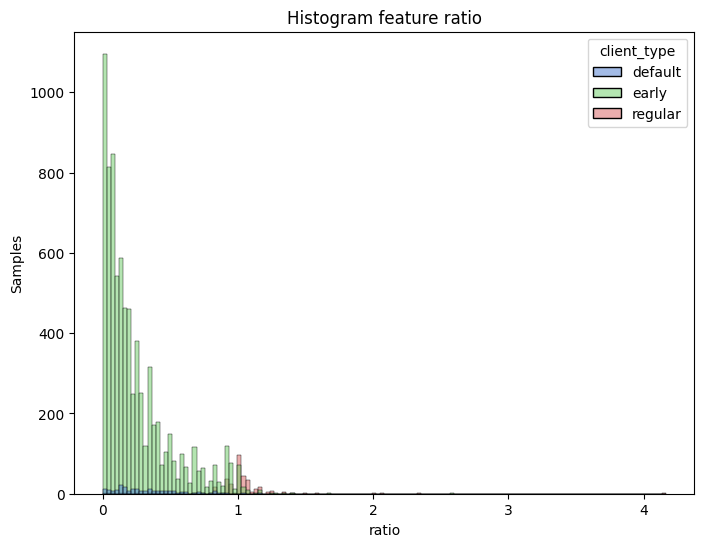

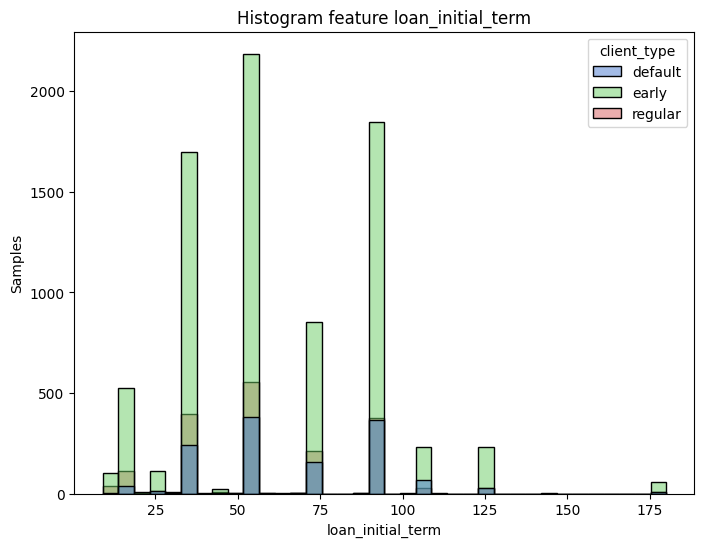

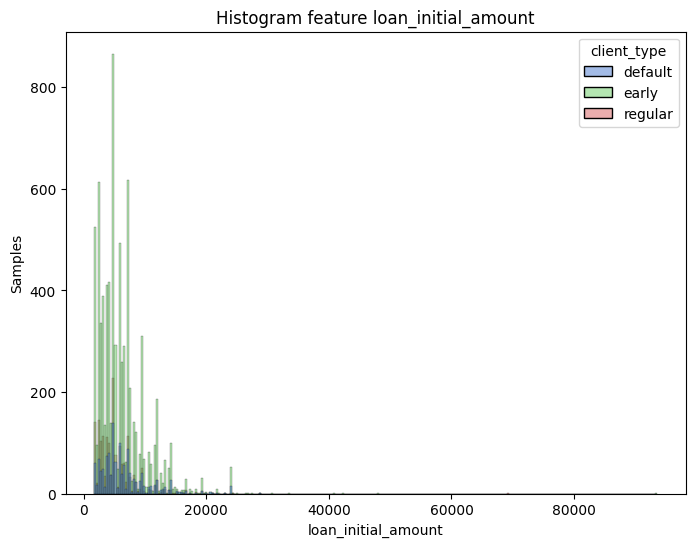

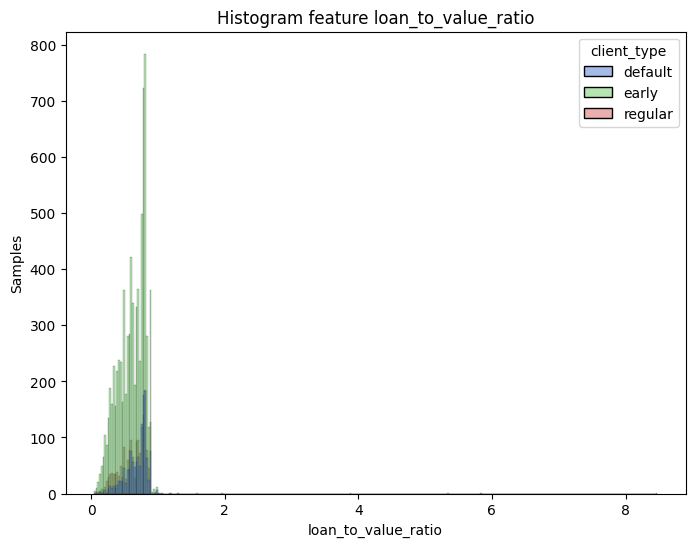

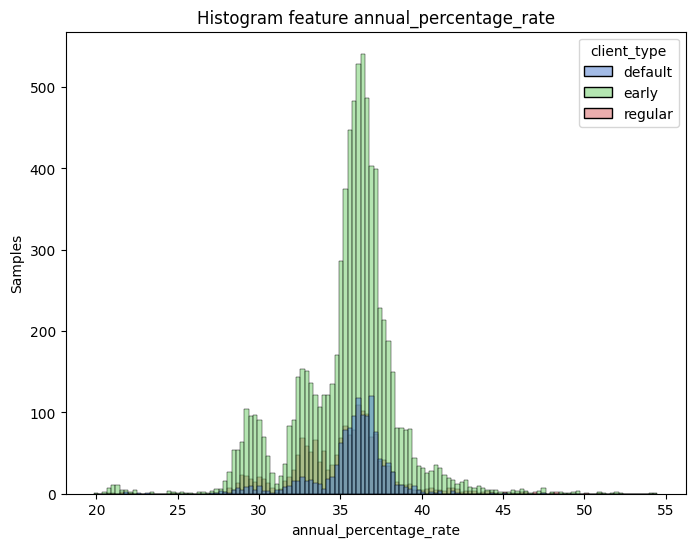

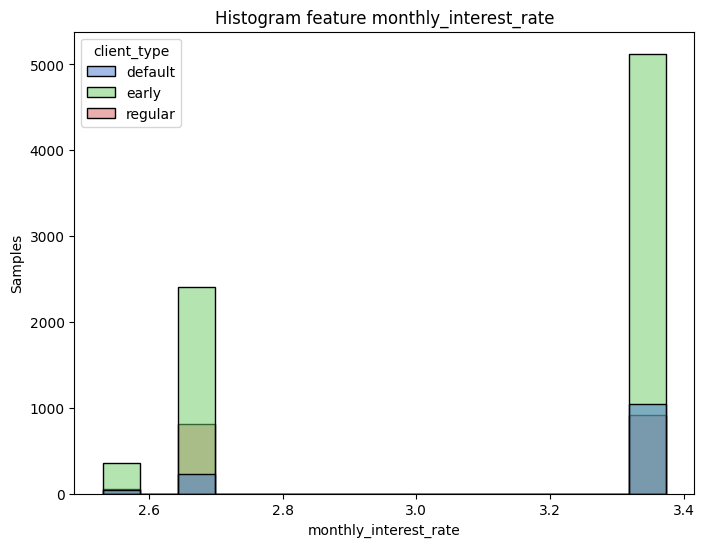

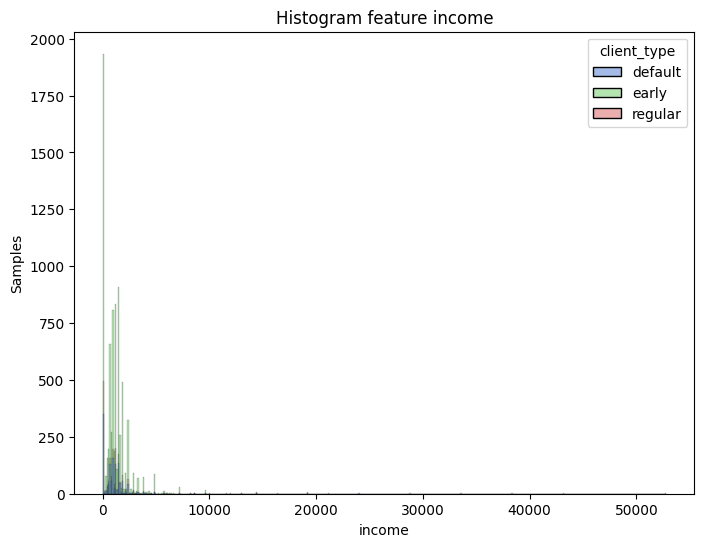

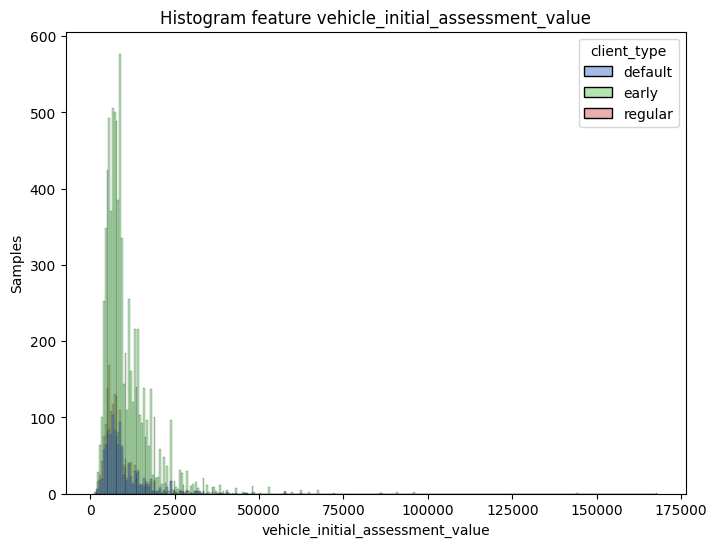

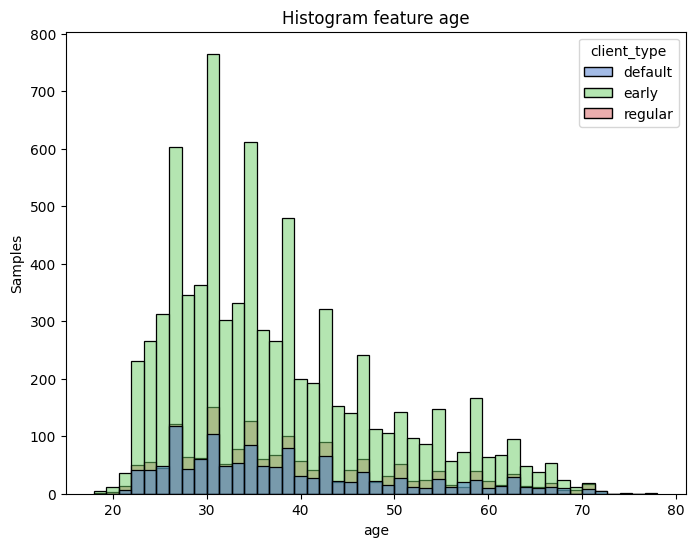

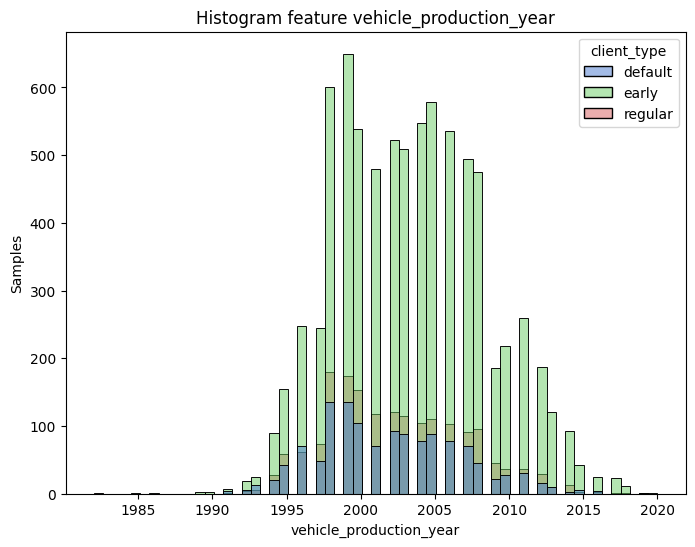

In [6]:
for column in df[numerical_features].columns:
    plt.figure(figsize=(8, 6))
    sns.histplot(df, x=column, hue="client_type")
    plt.title(f'Histogram feature {column}')
    plt.xlabel(column)
    plt.ylabel('Samples')
    plt.show()

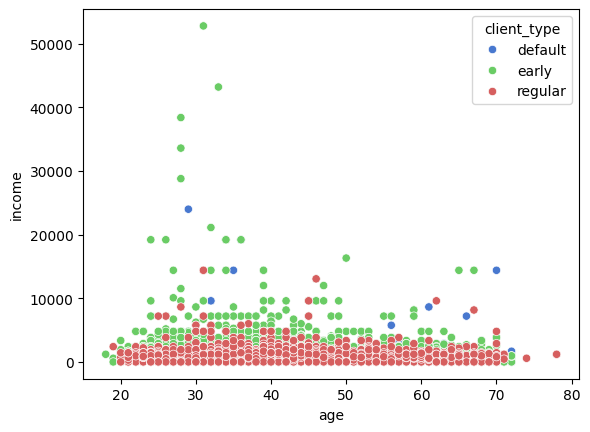

In [11]:
sns.scatterplot(data=df, x="age", y="income", hue="client_type")
plt.show()

In [ ]:
sns.scatterplot(data=df, x="age", y="income", hue="client_type")
plt.show()

In [ ]:
sns.scatterplot(data=df, x="age", y="income", hue="loan_type")
plt.show()

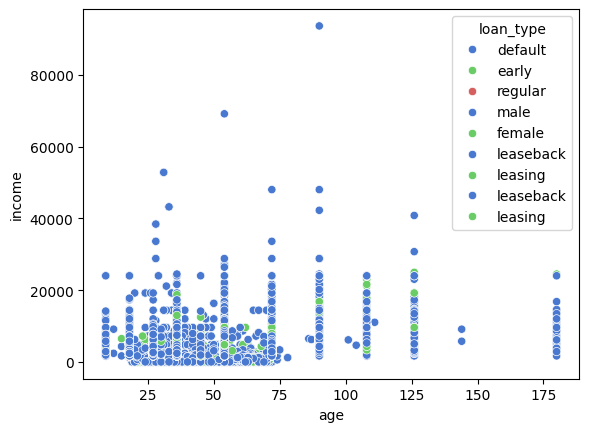

In [9]:
sns.scatterplot(data=df, x="loan_initial_term", y="loan_initial_amount", hue="loan_type")
plt.show()

Vehicle assessment value is increasing till 2019 year for regular and early and than drop to historical values.
Default clients has similar effect, but shifted roughly 5 years in past. 
Possibilities to see this kind of effect:
- changes in computation vehicle_initial_assessment_value
- taking different vehicles to insurance
- noises in the data(imbalanced dataset)

It's possible to have few effects at the same time.

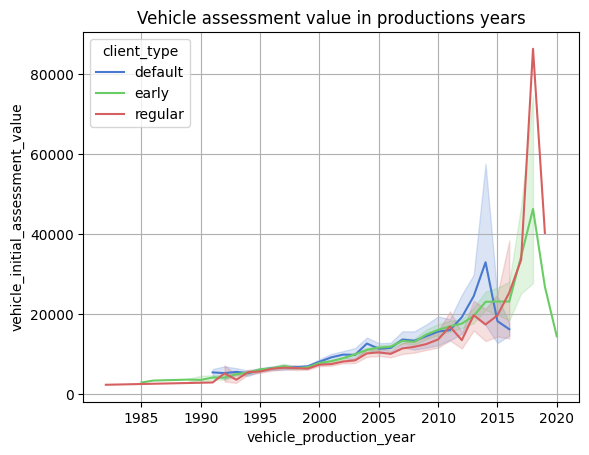

In [37]:
sns.lineplot(data=df, x="vehicle_production_year", y="vehicle_initial_assessment_value", hue="client_type")
plt.title("Mean vehicle assessment value in productions years")
plt.grid()
plt.show()

Positive significant correlations:
- vehicle_initial_assesment_value with

Negative significant correlations:
- loan_initial_term with ratio -0,48: 

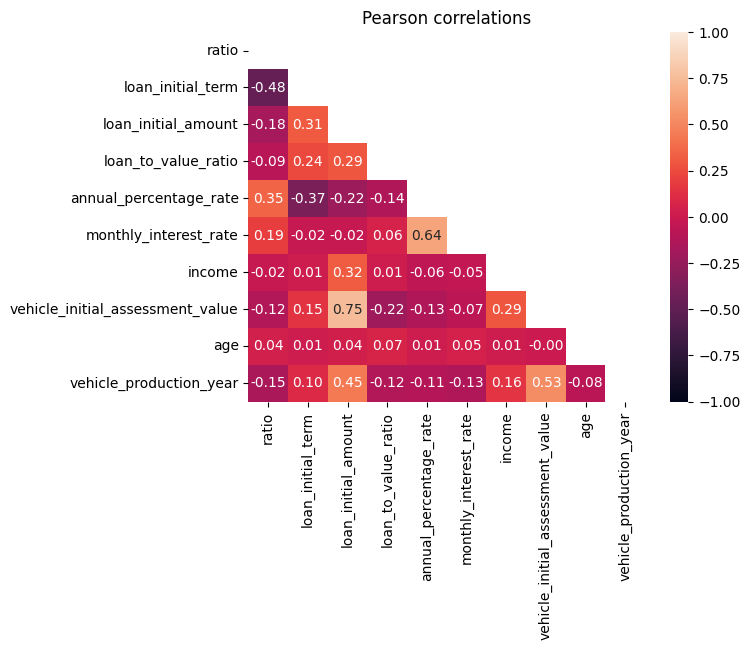

In [35]:
df_corr = df[numerical_features].corr()

plt.figure(figure=(16,16))
plt.title("Pearson correlations")
mask = np.triu(np.ones_like(df_corr, dtype=bool))
sns.heatmap(df_corr, annot=True, vmin=-1, vmax=1, fmt=".2f", mask=mask)
plt.show()

We can see that early client takes ....

In [7]:
sns.scatterplot(data=df, x="vehicle_initial_assessment_value", y="loan_initial_amount", hue="client_type")
plt.title("Mean vehicle assessment value in productions years")
plt.grid()
plt.show()

/tmp/ipykernel_6588/3095013600.py:4: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  plt.show()


In [55]:
ProfileReport(df_raw, title="Profiling Report")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [3]:
df_plotting = df_raw[df_raw["client_type"].isin(["default", "regular"])].drop(columns="clientid").reset_index(drop=True).copy()

In [5]:
df = df_raw.copy()
df.dropna(inplace=True)

sns.pairplot(df, hue="client_type")
plt.show()

/home/pawel/Desktop/civitta_task/venv/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/pawel/Desktop/civitta_task/venv/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/home/pawel/Desktop/civitta_task/venv/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/home/pawel/Desktop/civitta_task/ven

KeyboardInterrupt: 

Error in callback <function flush_figures at 0x7be10f4863b0> (for post_execute), with arguments args (),kwargs {}:


KeyboardInterrupt: 

In [92]:
df_raw[df_raw["client_type"] == "default"].describe()

,clientid,ratio,loan_initial_term,loan_initial_amount,loan_to_value_ratio,annual_percentage_rate,monthly_interest_rate,income,vehicle_production_year,vehicle_initial_assessment_value,age,had_car_loan,had_other_loans
count,1307.000000,211.000000,1307.000000,1307.000000,1307.000000,1307.000000,1307.000000,1307.000000,1307.000000,1307.000000,1305.000000,1307.000000,1307.000000
mean,653.000000,0.323283,66.629686,6621.399388,0.691552,35.688007,3.225134,1051.367253,2001.968630,9819.066565,38.356322,0.104820,0.102525
std,377.442711,0.238788,26.646526,4093.208991,0.211620,2.337609,0.293400,1432.818089,4.703271,6352.211288,12.039280,0.306439,0.303453
min,0.000000,0.000000,9.000000,1680.000000,0.061856,21.705606,2.530500,0.000000,1991.000000,2160.000000,21.000000,0.000000,0.000000
25%,326.500000,0.133333,54.000000,4080.000000,0.599342,35.129818,3.374000,0.000000,1998.000000,5880.000000,29.000000,0.000000,0.000000
50%,653.000000,0.266667,54.000000,5760.000000,0.746269,36.080893,3.374000,960.000000,2002.000000,7920.000000,36.000000,0.000000,0.000000
75%,979.500000,0.465278,90.000000,7680.000000,0.800000,36.928253,3.374000,1440.000000,2005.000000,11520.000000,45.000000,0.000000,0.000000
max,1306.000000,1.166667,180.000000,28800.000000,5.833333,47.497034,3.374000,24000.000000,2016.000000,62400.000000,72.000000,1.000000,1.000000


In [77]:
df_raw["ratio"].isnull().groupby(df_raw["client_type"]).sum()

client_type
default    1096
early        54
regular    1431
Name: ratio, dtype: int64

In [ ]:
Early clients 

/home/pawel/Desktop/civitta_task/venv/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/pawel/Desktop/civitta_task/venv/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/home/pawel/Desktop/civitta_task/venv/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/home/pawel/Desktop/civitta_task/ven

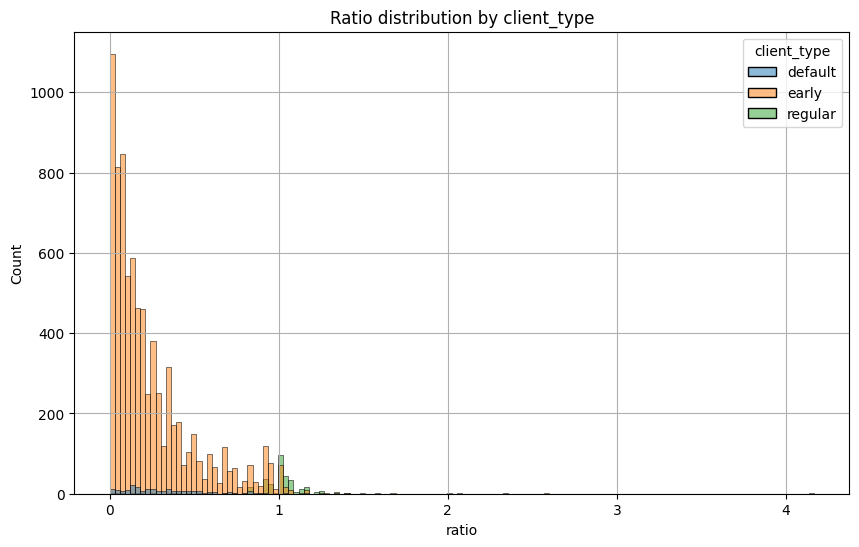

In [68]:
plt.figure(figsize=(10, 6))
sns.histplot(x='ratio', hue='client_type', data=df_raw)
plt.title('Ratio distribution by client_type')
plt.grid()
plt.show()

/home/pawel/Desktop/civitta_task/venv/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/pawel/Desktop/civitta_task/venv/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/home/pawel/Desktop/civitta_task/venv/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/home/pawel/Desktop/civitta_task/ven

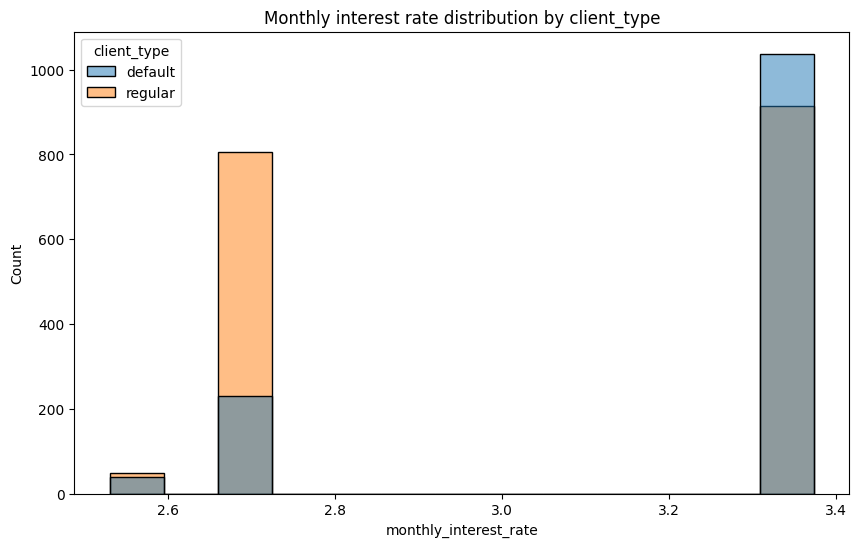

In [19]:
plt.figure(figsize=(10, 6))
sns.histplot(x='monthly_interest_rate', hue='client_type', data=df_plotting)
plt.title('Monthly interest rate distribution by client_type')
plt.show()

/home/pawel/Desktop/civitta_task/venv/lib/python3.10/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/home/pawel/Desktop/civitta_task/venv/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/home/pawel/Desktop/civitta_task/venv/lib/python3.10/site-packages/seaborn/_oldcore.py:1075: FutureWarning: When grouping with a length-1 list-like, you will need to pass a length-1 tuple to get_group in a future version of pandas. Pass `(name,)` instead of `name` to silence this warning.
  data_subset = grouped_data.get_group(pd_key)
/home/pawel/Desktop/civitta_task/ven

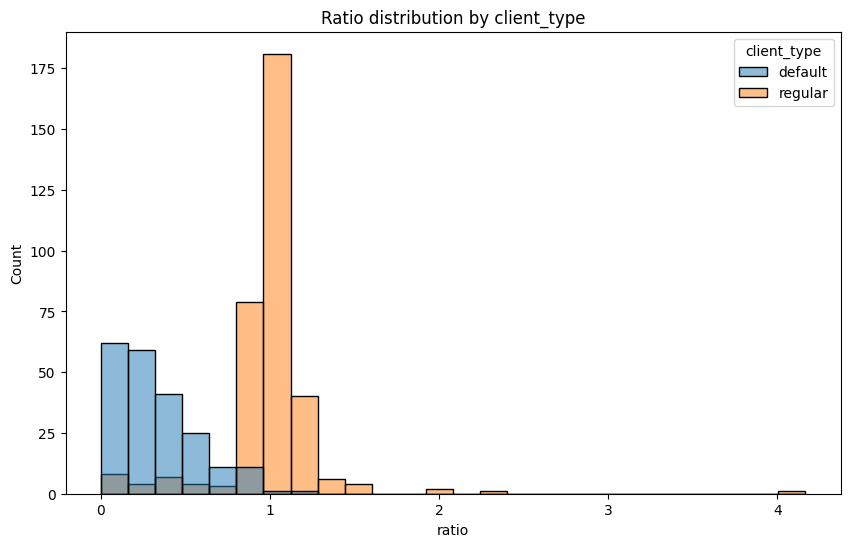

In [20]:
plt.figure(figsize=(10, 6))
sns.histplot(x='ratio', hue='client_type', data=df_plotting)
plt.title('Ratio distribution by client_type')
plt.show()

In the dataset we have a three types of clients: early, regular and default. Early clients are majority group, but is not significant in our task. Our task is to detect default clients. To decreace complexity of the model from multiclass classification to binary classification, we can take two group: default and regular. When we look at quantities of samples representing each group they are similar.
Client type quantity samples:
- early: 7892 samples
- regular: 1771 samples
- default: 1307 samples
- 
Ratio feature distribution for regular and default clients 

When we compare two types of client regular and defaults. Usually regular clients have higher ratio than default clients. Neverthelles when we add early clients for this comparision, we can see that ratio is close to zero for them.
On kernel density distribution we can see that default client has hiher monthly interest rates than regular clients. 



In [58]:
df_raw[~(df_raw["ratio"].notnull())]["client_type"].value_counts()

client_type
regular    1431
default    1096
early        54
Name: count, dtype: int64

In [28]:
df_raw[(df_raw["ratio"].notnull()) & (df_raw["client_type"] != "early")].groupby("client_type")["ratio"].mean()

client_type
default    0.323283
regular    0.993798
Name: ratio, dtype: float64

In [30]:
df_plotting.groupby(["client_type", "loan_type"]).count()["loan_initial_term"]

client_type  loan_type
default      leaseback    1042
             leasing       265
regular      leaseback    1524
             leasing       247
Name: loan_initial_term, dtype: int64

In [45]:
df_plotting.describe()

,ratio,loan_initial_term,loan_initial_amount,loan_to_value_ratio,annual_percentage_rate,monthly_interest_rate,income,vehicle_production_year,vehicle_initial_assessment_value,age,had_car_loan,had_other_loans
count,551.000000,3078.000000,3078.000000,3078.000000,3078.000000,3078.000000,3078.000000,3078.000000,3078.000000,3070.000000,3078.000000,3078.000000
mean,0.737031,62.232294,5952.168291,0.661389,35.353343,3.113067,1018.143925,2002.157895,9281.247563,38.788599,0.124107,0.141975
std,0.430852,26.687170,3846.264823,0.201163,2.824443,0.344611,1259.497223,4.695722,5975.770330,11.994728,0.329757,0.349082
min,0.000000,9.000000,1680.000000,0.061856,20.839618,2.530500,0.000000,1982.000000,1920.000000,19.000000,0.000000,0.000000
25%,0.333333,36.000000,3456.000000,0.555556,33.821773,2.671083,0.000000,1999.000000,5760.000000,29.000000,0.000000,0.000000
50%,0.916667,54.000000,4800.000000,0.714286,35.832428,3.374000,960.000000,2002.000000,7680.000000,36.000000,0.000000,0.000000
75%,1.000000,90.000000,7200.000000,0.800000,36.845542,3.374000,1440.000000,2006.000000,10560.000000,46.000000,0.000000,0.000000
max,4.166667,180.000000,69120.000000,5.833333,50.988071,3.374000,24000.000000,2019.000000,86400.000000,78.000000,1.000000,1.000000


In [15]:
# df_plotting[df_plotting["age"].notnull()][["client_type", "age"]].groupby("client_type").mean()
df_plotting[df_plotting["age"].notnull()][["loan_type", "client_type", "age"]].groupby(["loan_type", "client_type"]).mean()

age
loan_type client_type           
leaseback default      38.445192
          regular      39.032216
leasing   default      38.007547
          regular      39.581967

KeyboardInterrupt: 

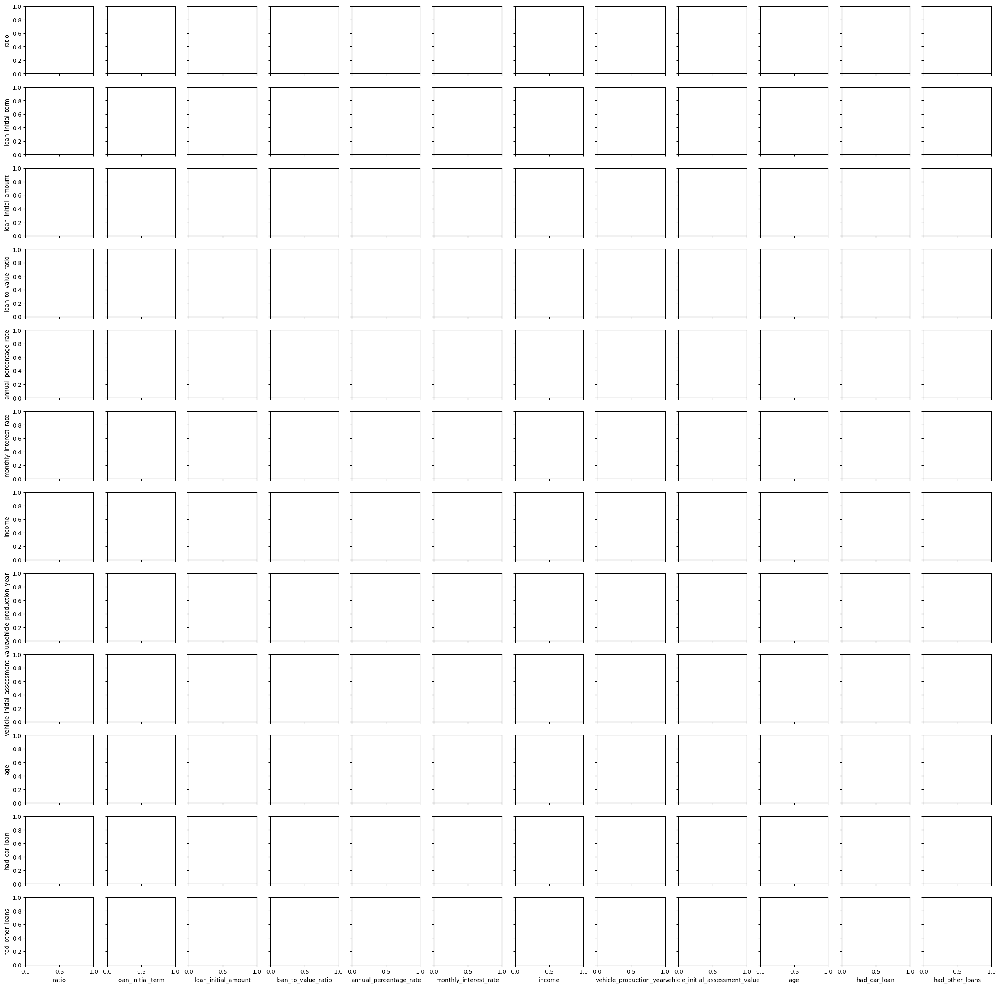

In [16]:
sns.pairplot(data=df_plotting[df_plotting["ratio"].notnull()], hue="client_type")
plt.show()

Strategy one vs all is working better than multiclass classification. The main goal of this task is to predict default on client_type column. Other labels like: early and regular we can join into one. Using this strategy we can get binary classification.

In [8]:
df_raw["client_type"].value_counts()

client_type
early      7892
regular    1771
default    1307
Name: count, dtype: int64

In [65]:
# df = df_raw[df_raw["client_type"].isin(["default", "regular"])].reset_index(drop=True).copy()

### Null checks

In [4]:
df_raw.isna().sum()

clientid                               0
client_type                            0
ratio                               2581
loan_type                              0
loan_initial_term                      0
loan_initial_amount                    0
loan_to_value_ratio                    0
annual_percentage_rate                 0
monthly_interest_rate                  0
region                              1090
branch                                 0
client_gender                          0
income                                 0
vehicle_production_year                0
vehicle_initial_assessment_value       0
age                                   22
had_car_loan                           0
had_other_loans                        0
dtype: int64

In [5]:
df_raw[~df_raw["region"].notnull()].client_type.value_counts()

client_type
early      799
default    158
regular    133
Name: count, dtype: int64

In [11]:
df_raw[~df_raw["region"].notnull()]["client_type"].value_counts()

client_type
early      799
default    158
regular    133
Name: count, dtype: int64

In [23]:
df_raw[~df_raw["age"].notnull()]

,clientid,client_type,ratio,loan_type,loan_initial_term,loan_initial_amount,loan_to_value_ratio,annual_percentage_rate,monthly_interest_rate,region,branch,client_gender,income,vehicle_production_year,vehicle_initial_assessment_value,age,had_car_loan,had_other_loans
173,173,default,0.116667,leaseback,90,11520,0.800000,35.157083,3.374000,NaN,branch 3,male,0,2001,14400,NaN,1,0
1228,1228,default,NaN,leaseback,90,6720,0.800000,36.758909,3.374000,NaN,branch 5,male,0,1996,8400,NaN,0,0
1861,1861,early,0.750000,leaseback,18,1680,0.350000,36.815581,3.374000,NaN,branch 5,male,0,1991,4800,NaN,0,0
2239,2239,early,0.562500,leaseback,72,3840,0.500000,37.136404,3.374000,NaN,branch 3,male,0,2002,7680,NaN,1,0
2487,2487,early,0.500000,leaseback,18,1680,0.159091,40.824239,3.374000,NaN,branch 3,male,0,2004,10560,NaN,0,0
2827,2827,early,0.416667,leasing,36,2640,0.458333,36.825925,3.374000,NaN,branch 3,male,0,2005,5760,NaN,0,0
4071,4071,early,0.250000,leaseback,72,3360,0.700000,36.554530,3.374000,NaN,branch 5,male,0,1997,4800,NaN,0,0
4486,4486,early,0.208333,leaseback,36,1680,0.241379,36.227212,3.374000,NaN,branch 5,male,0,1996,6960,NaN,0,0
4490,4490,early,0.208333,leaseback,36,2640,0.323529,37.808941,3.374000,NaN,branch 3,male,0,2003,8160,NaN,0,0
5960,5960,early,0.116667,leaseback,90,5760,0.705882,36.392040,3.374000,NaN,branch 3,male,0,2005,8160,NaN,0,0


### Decision tree regressor to fill missing ratio
I drop age and region null samples

In [28]:
df_imp[~df_imp["ratio"].notnull()].index

Index([  211,   212,   213,   214,   215,   216,   217,   218,   219,   220,
       ...
       10960, 10961, 10962, 10963, 10964, 10965, 10966, 10967, 10968, 10969],
      dtype='int64', length=2581)

In [40]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import r2_score

df_imp = df_raw.copy()
df_imp.dropna(subset=["age", "region"], inplace=True)
y_imp = df_imp[["ratio"]]
imp_columns = df_imp.columns.difference(
    ["ratio", "branch", "client_gender", "client_type", "clientid", "loan_type", "region"]
)

X_imp_train = df_imp[df_imp["ratio"].notnull()][imp_columns]
y_imp_train = df_imp[df_imp["ratio"].notnull()]["ratio"]
X_imp_test = df_imp[~df_imp["ratio"].notnull()][imp_columns]

dtr_imputer = DecisionTreeRegressor(random_state=123)
dtr_imputer.fit(X_imp_train, y_imp_train)
print(r2_score(y_imp_train, dtr_imputer.predict(X_imp_train)))

df_imp.loc[X_imp_test.index, "ratio"] = dtr_imputer.predict(X_imp_test)

0.9999946145964395


Droping null rows with SMOTE or NearMiss is not working.  
Fast, memory efficient Multiple Imputation by Chained Equations (MICE) with lightgbm.
miceforest imputer

Work on features(transform they) and null values.

In [6]:
numerical_features = [
    "ratio", 
    "loan_initial_term", 
    "loan_initial_amount", "loan_to_value_ratio",
    "annual_percentage_rate", "monthly_interest_rate",
    "income", "vehicle_initial_assessment_value", "age",
    "vehicle_production_year"
    ]
nominal_features = [
    "loan_type", "region", "branch", "client_gender"
    ]
ordinal_features = [
    , "had_car_loan", "had_other_loans"
]

target = "client_type"

# null values here: ratio, region, income

In [7]:
df = df_raw.copy()

In [8]:
df["client_type"].value_counts()

client_type
early      7892
regular    1771
default    1307
Name: count, dtype: int64

In [69]:
import miceforest as mf

X_to_impute = df[ordinal_features + numerical_features + nominal_features]

kds = mf.ImputationKernel(
  X_to_impute,
  save_all_iterations=True,
  random_state=123
)

# Run the MICE algorithm for 2 iterations
kds.mice(2)

# Return the completed dataset.
X_imputed = kds.complete_data()

/home/pawel/Desktop/civitta_task/venv/lib/python3.10/site-packages/miceforest/ImputationKernel.py:370: UserWarning: [region] have very rare categories, it is a good idea to group these, or set the min_data_in_leaf parameter to prevent lightgbm from outputting 0.0 probabilities.
  warn(


Imputation using mean....

Good results when dropping nulls: age, ratio?

### Data standarization and transformation

In [9]:
df = df_raw.copy()
df.dropna(axis=1, inplace=True)

In [70]:
from civitta.transform_pipeline import TransformationPipeline

transform_pipe = TransformationPipeline()

# nominal data
nominal_data = transform_pipe.nominal_pipeline.fit_transform(X_imputed[nominal_features])
nominal_columns = transform_pipe.nominal_pipeline.get_feature_names_out()
X_nominal = pd.DataFrame.sparse.from_spmatrix(nominal_data, columns=nominal_columns)

# ordinal data
ordinal_data = transform_pipe.ordinal_pipeline.fit_transform(X_imputed[ordinal_features])
ordinal_columns = transform_pipe.ordinal_pipeline.get_feature_names_out()
X_ordinal = pd.DataFrame(ordinal_data, columns=ordinal_columns)

# numerical data
numerical_data = transform_pipe.numerical_pipeline.fit_transform(X_imputed[numerical_features])
numerical_columns = transform_pipe.numerical_pipeline.get_feature_names_out()
X_numerical = pd.DataFrame(numerical_data, columns=numerical_columns)


In [19]:
transform_pipe.ordinal_pipeline.fit_transform(df[["client_type"]])

array([[0.],
       [0.],
       [0.],
       ...,
       [2.],
       [2.],
       [2.]])

In [54]:
X = pd.concat([X_numerical, X_nominal, X_ordinal], axis=1)
y = transform_pipe.ordinal_pipeline.fit_transform(df[["client_type"]])

In [71]:
df_imputed = pd.concat([X_numerical, X_nominal, X_ordinal, df["client_type"]], axis=1)
df_dr = df_imputed[df_imputed["client_type"].isin(["default", "regular"])]
df_er = df_imputed[df_imputed["client_type"].isin(["early", "regular"])]

In [72]:
X_dr = df_dr.loc[:, df_dr.columns != "client_type"]
y_dr = df_dr["client_type"].apply(lambda x: 1 if x == "default" else 0)

In [57]:
y_dr.value_counts()

client_type
0    294
1    184
Name: count, dtype: int64

In [58]:
X_er = df_er.loc[:, df_er.columns != "client_type"]
y_er = df_er["client_type"].apply(lambda x: 1 if x == "early" else 0)

In [59]:
y_er.value_counts()

client_type
1    7040
0     294
Name: count, dtype: int64

### K-means

/home/pawel/Desktop/civitta_task/venv/lib/python3.10/site-packages/sklearn/utils/validation.py:869: UserWarning: pandas.DataFrame with sparse columns found.It will be converted to a dense numpy array.
  warnings.warn(
/home/pawel/Desktop/civitta_task/venv/lib/python3.10/site-packages/sklearn/utils/validation.py:869: UserWarning: pandas.DataFrame with sparse columns found.It will be converted to a dense numpy array.
  warnings.warn(
/home/pawel/Desktop/civitta_task/venv/lib/python3.10/site-packages/sklearn/utils/validation.py:869: UserWarning: pandas.DataFrame with sparse columns found.It will be converted to a dense numpy array.
  warnings.warn(
/home/pawel/Desktop/civitta_task/venv/lib/python3.10/site-packages/sklearn/utils/validation.py:869: UserWarning: pandas.DataFrame with sparse columns found.It will be converted to a dense numpy array.
  warnings.warn(
/home/pawel/Desktop/civitta_task/venv/lib/python3.10/site-packages/sklearn/utils/validation.py:869: UserWarning: pandas.DataFram

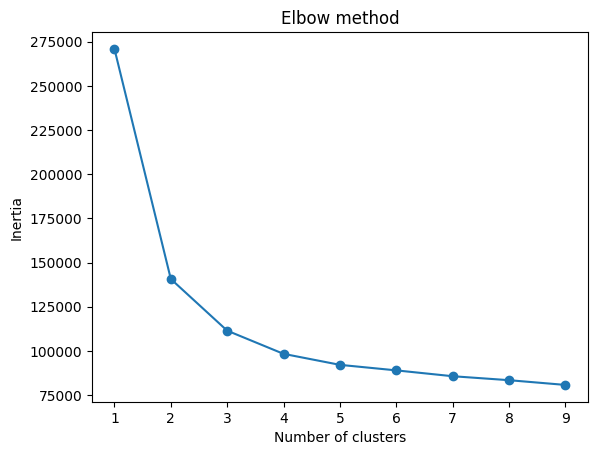

In [33]:
from sklearn.cluster import KMeans

# elbow method
inertia = []
for k in range(1, 10):
    kmeans = KMeans(n_clusters=k, random_state=0)
    kmeans.fit(X)
    inertia.append(kmeans.inertia_)

plt.plot(range(1, 10), inertia, marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Inertia')
plt.title('Elbow method')
plt.show()

Based on elbow method computed in k-means algorithm, we can see that even two groups represents dataset and decrease inertia.

In [60]:
from sklearn.model_selection import train_test_split
from imblearn.under_sampling import RandomUnderSampler

seed = 123
X_er_train, X_er_test, y_er_train, y_er_test = train_test_split(
    X_er, y_er, random_state=seed, train_size=0.8
)


rus_er = RandomUnderSampler(random_state=seed)
X_er_train_rus, y_er_train_rus = rus_er.fit_resample(X_er_train, y_er_train)
y_er_train_rus.value_counts()

client_type
0    237
1    237
Name: count, dtype: int64

In [61]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

rf_er_clf = RandomForestClassifier(random_state=seed)
rf_er_clf.fit(X_er_train_rus, y_er_train_rus)
rf_er_preds = rf_er_clf.predict(X_er_test)

print(classification_report(y_er_test, rf_er_preds))
ks_roc_auc_er = evaluate_ks_and_roc_auc(y_er_test, rf_er_clf.predict_proba(X_er_test))

/home/pawel/Desktop/civitta_task/venv/lib/python3.10/site-packages/sklearn/utils/validation.py:869: UserWarning: pandas.DataFrame with sparse columns found.It will be converted to a dense numpy array.
  warnings.warn(


              precision    recall  f1-score   support

           0       0.16      1.00      0.28        57
           1       1.00      0.79      0.88      1410

    accuracy                           0.80      1467
   macro avg       0.58      0.89      0.58      1467
weighted avg       0.97      0.80      0.86      1467

KS: 0.7872 (p-value: 3.250e-36)
ROC AUC: 0.8936


/home/pawel/Desktop/civitta_task/venv/lib/python3.10/site-packages/sklearn/utils/validation.py:869: UserWarning: pandas.DataFrame with sparse columns found.It will be converted to a dense numpy array.
  warnings.warn(
/home/pawel/Desktop/civitta_task/venv/lib/python3.10/site-packages/sklearn/utils/validation.py:869: UserWarning: pandas.DataFrame with sparse columns found.It will be converted to a dense numpy array.
  warnings.warn(


In [49]:
print(confusion_matrix(y_er_test, rf_er_preds))

[[  57    0]
 [ 300 1110]]


In [74]:
X_dr_train, X_dr_test, y_dr_train, y_dr_test = train_test_split(
    X_dr, y_dr, random_state=seed, train_size=0.8
)

rus_dr = RandomUnderSampler(random_state=seed)
X_dr_train_rus, y_dr_train_rus = rus_dr.fit_resample(X_dr_train, y_dr_train)
y_dr_train_rus.value_counts()
# smote_dr = SMOTE(random_state=seed)
# X_dr_train_smote, y_dr_train_smote = smote_dr.fit_resample(X_dr_train, y_dr_train)
# y_dr_train_smote.value_counts()

client_type
0    145
1    145
Name: count, dtype: int64

In [76]:
from sklearn.ensemble import RandomForestClassifier

rf_dr_clf = RandomForestClassifier(random_state=seed)
rf_dr_clf.fit(X_dr_train_rus, y_dr_train_rus)
rf_dr_preds = rf_dr_clf.predict(X_dr_test)

print(classification_report(y_dr_test, rf_dr_preds))
ks_roc_auc_dr = evaluate_ks_and_roc_auc(y_dr_test, rf_dr_clf.predict_proba(X_dr_test))

/home/pawel/Desktop/civitta_task/venv/lib/python3.10/site-packages/sklearn/utils/validation.py:869: UserWarning: pandas.DataFrame with sparse columns found.It will be converted to a dense numpy array.
  warnings.warn(


              precision    recall  f1-score   support

           0       1.00      1.00      1.00        57
           1       1.00      1.00      1.00        39

    accuracy                           1.00        96
   macro avg       1.00      1.00      1.00        96
weighted avg       1.00      1.00      1.00        96

KS: 1.0000 (p-value: 1.667e-27)
ROC AUC: 1.0000


/home/pawel/Desktop/civitta_task/venv/lib/python3.10/site-packages/sklearn/utils/validation.py:869: UserWarning: pandas.DataFrame with sparse columns found.It will be converted to a dense numpy array.
  warnings.warn(
/home/pawel/Desktop/civitta_task/venv/lib/python3.10/site-packages/sklearn/utils/validation.py:869: UserWarning: pandas.DataFrame with sparse columns found.It will be converted to a dense numpy array.
  warnings.warn(


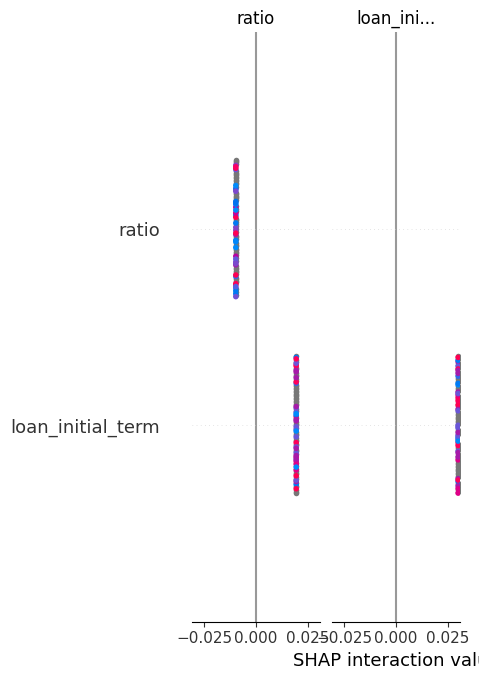

In [77]:
import shap

explainer = shap.Explainer(rf_dr_clf)
shap_values = explainer.shap_values(X_dr_test)
shap.summary_plot(shap_values, X_dr_test)

In [95]:
print(confusion_matrix(y_dr_test, rf_dr_preds))

[[54  3]
 [ 5 34]]


In [67]:
from sklearn.model_selection import train_test_split
from collections import Counter

seed = 123
X_train, X_test, y_train, y_test = train_test_split(
    X, y, random_state=seed, train_size=0.8
)

Counter(y_train.reshape(len(y_train)))

Counter({1.0: 6301, 2.0: 1441, 0.0: 1034})

In [68]:
from imblearn.under_sampling import RandomUnderSampler
from collections import Counter

rus = RandomUnderSampler(random_state=seed)
X_train_rus, y_train_rus = rus.fit_resample(X_train, y_train)
# y_train_rus.value_counts()
Counter(y_train_rus)

Counter({0.0: 1034, 1.0: 1034, 2.0: 1034})

In [69]:
from imblearn.over_sampling import RandomOverSampler

ros = RandomOverSampler(random_state=seed)
X_train_ros, y_train_ros = ros.fit_resample(X_train, y_train)
y_train_ros.value_counts()

AttributeError: 'numpy.ndarray' object has no attribute 'value_counts'

In [45]:
from imblearn.over_sampling import SMOTE

sm = SMOTE(random_state = seed)
X_train_sm, y_train_sm = sm.fit_resample(X_train, y_train)
# y_train_sm.value_counts()

NameError: name 'X_train' is not defined

In [46]:
from imblearn.under_sampling import NearMiss 
nr = NearMiss()

X_train_miss, y_train_miss = nr.fit_resample(X_train, y_train)
y_train_miss.value_counts()

NameError: name 'X_train' is not defined

In [38]:
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_recall_fscore_support, precision_score, f1_score, recall_score, fbeta_score

In [37]:
from scipy.stats import ks_2samp
from sklearn.metrics import roc_auc_score

def evaluate_ks_and_roc_auc(y_real, y_proba):
    # Unite both visions to be able to filter
    df = pd.DataFrame()
    df['real'] = y_real
    df['proba'] = y_proba[:, 1]
    
    # Recover each class
    class0 = df[df['real'] == 0]
    class1 = df[df['real'] == 1]
    
    ks = ks_2samp(class0['proba'], class1['proba'])
    roc_auc = roc_auc_score(df['real'] , df['proba'])
    
    print(f"KS: {ks.statistic:.4f} (p-value: {ks.pvalue:.3e})")
    print(f"ROC AUC: {roc_auc:.4f}")
    return {"ks_statistic": ks.statistic, "roc_auc": roc_auc}

In [73]:
# import mlflow

# mlflow.set_experiment("civitta_task")
# mlflow.sklearn.autolog()

In [74]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.multiclass import OneVsRestClassifier


train_pair = [(X_train, y_train, "simple_train"), 
              (X_train_rus, y_train_rus, "random under sampling"),
              # (X_train_ros, y_train_ros, "random over sampling"), 
              (X_train_sm, y_train_sm, "smote")]
              # (X_train_miss, y_train_miss, "near miss")]

for X_train, y_train, pair_str in train_pair:
    rf_clf = RandomForestClassifier(random_state=seed)
    ovo_clf = OneVsRestClassifier(rf_clf)
    print(pair_str)
    # dataset = mlflow.data.from_pandas(
    #     df_raw, source="data/", name="civitta_default_task", targets="client_type"
    # )
    # mlflow.log_input(dataset, context="raw_dataset")
    ovo_clf.fit(X_train, y_train)
    rf_preds = ovo_clf.predict(X_test)
    print(classification_report(y_test, rf_preds))
    # prfs_metrics = precision_recall_fscore_support(y_test, rf_preds)
    # prfs_metrics
    # accuracy = accuracy_score(y_test, rf_preds)
    # precision = precision_score(y_test, rf_preds)
    # recall = recall_score(y_test, rf_preds)
    # f1 = f1_score(y_test, rf_preds)
    
    # metrics_dict = {
    #     "accuracy_test": accuracy,
    #     "precision_test": precision,
    #     "recall_test": recall,
    #     "f1_test": f1
    # }
    # print(metrics_dict)
    # mlflow.log_metrics(metrics_dict)
    # ks_roc_auc = evaluate_ks_and_roc_auc(y_test, ovo_clf.predict(X_test))
    # print(ks_roc_auc)
    # mlflow.log_metrics(ks_roc_auc)

simple_train
              precision    recall  f1-score   support

         0.0       0.83      0.02      0.04       273
         1.0       0.74      0.98      0.84      1591
         2.0       0.52      0.10      0.17       330

    accuracy                           0.73      2194
   macro avg       0.70      0.37      0.35      2194
weighted avg       0.72      0.73      0.64      2194

random under sampling
              precision    recall  f1-score   support

         0.0       0.21      0.53      0.30       273
         1.0       0.81      0.41      0.54      1591
         2.0       0.26      0.55      0.35       330

    accuracy                           0.44      2194
   macro avg       0.43      0.50      0.40      2194
weighted avg       0.65      0.44      0.48      2194

smote
              precision    recall  f1-score   support

         0.0       0.28      0.10      0.15       273
         1.0       0.75      0.91      0.82      1591
         2.0       0.41      0.20 

In [70]:
metrics_dict

{'accuracy_test': 0.3517206477732793,
 'precision_test': 0.11609110947832477,
 'recall_test': 0.6694915254237288,
 'f1_test': 0.19787100814026298}

In [44]:
confusion_matrix(y_test, rf_preds)

array([[149,  74,  50],
       [482, 670, 439],
       [ 74,  77, 179]])

In [38]:
dict(zip(X.columns, rf_clf.feature_importances_))

{'ratio': 0.35651099021807026,
 'loan_initial_term': 0.18743947835580407,
 'loan_initial_amount': 0.05788177716768469,
 'loan_to_value_ratio': 0.05622384708592681,
 'annual_percentage_rate': 0.09985254203500708,
 'monthly_interest_rate': 0.008454907257498838,
 'loan_type_leaseback': 0.006668935463796916,
 'loan_type_leasing': 0.005490916060944815,
 'region_region 1': 0.0005033103948868475,
 'region_region 10': 0.002320539121709228,
 'region_region 2': 0.005368073142365028,
 'region_region 3': 0.0033263063713726386,
 'region_region 4': 0.0004933589372853994,
 'region_region 5': 0.0054354586933640136,
 'region_region 6': 0.006793363241958245,
 'region_region 7': 0.003322094856915341,
 'region_region 8': 0.010977842590646145,
 'region_region 9': 0.0014601105604525157,
 'branch_branch 1': 0.0010878001874050443,
 'branch_branch 2': 0.005244673409582552,
 'branch_branch 3': 0.007301765389476841,
 'branch_branch 4': 0.0013635902840307581,
 'branch_branch 5': 0.009385900307007236,
 'branch_bra

In [89]:
from xgboost import XGBClassifier

xgb_clf = XGBClassifier(n_estimators=100, objective="binary:logistic")
xgb_clf.fit(X_train, y_train)
xgb_preds = xgb_clf.predict(X_test)

print(classification_report(y_test, xgb_preds))

              precision    recall  f1-score   support

           0       0.84      0.24      0.37      1921
           1       0.11      0.68      0.19       273

    accuracy                           0.29      2194
   macro avg       0.48      0.46      0.28      2194
weighted avg       0.75      0.29      0.35      2194



In [64]:
confusion_matrix(y_test, xgb_preds)

array([[ 457, 1464],
       [  88,  185]])

In [32]:
dict(zip(xgb_clf.feature_names_in_, xgb_clf.feature_importances_))

{'ratio': 0.022568317,
 'loan_initial_term': 0.022118686,
 'loan_initial_amount': 0.02467863,
 'loan_to_value_ratio': 0.024341447,
 'annual_percentage_rate': 0.02623468,
 'monthly_interest_rate': 0.053010896,
 'loan_type_leaseback': 0.046949532,
 'loan_type_leasing': 0.0,
 'region_region 1': 0.0470632,
 'region_region 10': 0.036915515,
 'region_region 11': 0.0,
 'region_region 12': 0.0,
 'region_region 2': 0.030227536,
 'region_region 3': 0.027406346,
 'region_region 4': 0.026424283,
 'region_region 5': 0.034860775,
 'region_region 6': 0.020203743,
 'region_region 7': 0.024078121,
 'region_region 8': 0.018925823,
 'region_region 9': 0.027626524,
 'branch_branch 1': 0.029591845,
 'branch_branch 2': 0.03328023,
 'branch_branch 3': 0.058276147,
 'branch_branch 4': 0.012837648,
 'branch_branch 5': 0.03399789,
 'branch_branch 6': 0.021600649,
 'branch_branch 7': 0.025510795,
 'client_gender_female': 0.037477124,
 'client_gender_male': 0.0,
 'vehicle_production_year': 0.035356924,
 'vehicle_

def decide_default

In [90]:
xgb_clf.predict_proba(X_test)

array([[0.08817297, 0.911827  ],
       [0.90647703, 0.09352298],
       [0.16624725, 0.83375275],
       ...,
       [0.28491336, 0.71508664],
       [0.7363757 , 0.2636243 ],
       [0.08229142, 0.9177086 ]], dtype=float32)

In [97]:
x = np.array([[0.18817297, 0.911827],
       [0.50647703, 0.09352298],
       [0.16624725, 0.83375275]])
y = np.array([[0.08817297, 0.911827],
       [0.90647703, 0.09352298],
       [0.46624725, 0.83375275]])

np.where(x[:, pred_x] >= y[:, pred_y], pred_x, pred_y)

array([1, 0, 0])

In [ ]:

def decide_default_early(dr_model_proba, er_model_proba):
    if dr_model_proba[:, 0] > er_model_proba[:, 0]:
    np.where(r_model_proba[:, 0] > er_model_proba[:, 0], "default", "early")
    

### Model checking on early clients

If our methodology is good, we should classify early clients as a 0 (non-default)

In [55]:
df_early = df_raw[df_raw["client_type"].isin(["early"])].reset_index(drop=True).copy()

In [56]:
from civitta.transform_pipeline import TransformationPipeline

transform_pipe = TransformationPipeline()

# nominal data
nominal_early_data = transform_pipe.nominal_pipeline.fit_transform(df_early[transform_pipe.nominal_features])
nominal_early_columns = transform_pipe.nominal_pipeline.get_feature_names_out()
X_early_nominal = pd.DataFrame.sparse.from_spmatrix(nominal_early_data, columns=nominal_early_columns)

# ordinal data
ordinal_early_data = transform_pipe.ordinal_pipeline.fit_transform(df_early[transform_pipe.ordinal_features])
ordinal_early_columns = transform_pipe.ordinal_pipeline.get_feature_names_out()
X_early_ordinal = pd.DataFrame(ordinal_early_data, columns=ordinal_early_columns)

# numerical data
numerical_early_data = transform_pipe.numerical_pipeline.fit_transform(df_early[transform_pipe.numerical_features])
numerical_early_columns = transform_pipe.numerical_pipeline.get_feature_names_out()
X_early_numerical = pd.DataFrame(numerical_early_data, columns=numerical_early_columns)

2024/04/28 18:28:06 WARNING mlflow.utils.autologging_utils: MLflow autologging encountered a warning: "/home/pawel/Desktop/civitta_task/venv/lib/python3.10/site-packages/mlflow/data/digest_utils.py:26: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead."
2024/04/28 18:28:23 WARNING mlflow.sklearn: Training metrics will not be recorded because training labels were not specified. To automatically record training metrics, provide training labels as inputs to the model training function.
2024/04/28 18:28:23 WARNING mlflow.sklearn: Model was missing function: predict. Not logging python_function flavor!
2024/04/28 18:28:26 WARNING mlflow.utils.autologging_utils: Encountered unexpected error during sklearn autologging: The following failures occurred while performing one or more logging operations: [MlflowException('Failed to perform one or more operations on the run with ID 9572fd6e0d204da690262bbdec4b5fcf. Failed operations: [MlflowException("Changing param va

In [89]:
X_early = pd.concat([X_early_numerical, X_early_nominal, X_early_ordinal], axis=1)
y_early = df_early["client_type"].replace("early", 0)

/tmp/ipykernel_86870/1281219598.py:2: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  y_early = df_early["client_type"].replace("early", 0)


In [118]:
X_early.drop(columns=["region_region 12", "region_region 11"], inplace=True)

In [119]:
xgb_early_preds = xgb_clf.predict(X_early)
print(classification_report(y_early, xgb_early_preds))

              precision    recall  f1-score   support

           0       1.00      0.26      0.41      7040
           1       0.00      0.00      0.00         0

    accuracy                           0.26      7040
   macro avg       0.50      0.13      0.21      7040
weighted avg       1.00      0.26      0.41      7040



/home/pawel/Desktop/civitta_task/venv/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/pawel/Desktop/civitta_task/venv/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/home/pawel/Desktop/civitta_task/venv/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1509: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(r

In [121]:
print(confusion_matrix(y_early, xgb_early_preds))

[[1836 5204]
 [   0    0]]
